# ECE471 - Landcover Classification
* Instructor: Krishna Karra
* Email: krishna.karra@gmail.com
* Assigned: Monday March 15, 2021
* Due: Friday April 9, 2021

**For this assignment, you will be training a landcover classification model from the [National Landcover Database](https://www.usgs.gov/centers/eros/science/national-land-cover-database?qt-science_center_objects=0#).**

The dataset consists of 1340 total samples. Every image is a 256x256 Landsat 8 image taken from spring to fall in 2016. You have been provided the following bands in each image file: 

* [coastal-aerosol, blue, green, red, nir, swir1, swir2, tirs1, cloud-mask, alpha]

An attempt was made to render each scene mostly cloud free, but a cloud mask is provided along with each image chip.

The corresponding target image to each image is a single-band image with NLCD classification labels taken from 2016.

Your over-arching goal is to build a pixel-wise segmentation model that outputs the following classes:

* [water, snow/ice, built area, bare, forest, shrub/scrub, grass, crops, wetlands]

Note that the number of classes your model needs to output is less than the number of classes in NLCD.

## Dataset details

The data exists in google cloud storage, in a public facing read-only storage bucket. You will access all the file links to access the data via a CSV file which also exists in the bucket, that contains the entire dataset that is available to be processed. See the example code for how to access these data. Rasterio will be able to load in a GeoTIFF file from a URL that corresponds to each file in cloud storage.

**Do not make an attempt to modify this storage bucket in any way, or I will get in trouble.**

## Task 1: Analyze the distribution of the dataset

Your first task is to analyze the distribution of the dataset. This will inform properties about your model (e.g. how well it will generalize). In particular, you should look at both the geographic spread of the where the dataset has been sampled, and the number of pixels that belong to each class. 

Note that since you will need to re-map the input NLCD labels to the specified output labels, you will want to look at the re-mapped distribution of pixels across the dataset.

Any other analysis that you do to better understand the underlying data (and which may affect your model parameters, architecture, etc.) falls under this section.

## Task 2: Train a landcover classification model

Your second task is to train a landcover classification model. I have given you some tensorflow code to get started, which should give you a sense of how to build a data loader and input pipeline. When implemented properly, tensorflow will manage the "lazy-loading" of the dataset for you (e.g. only loading as much data as it needs to at once to keep the GPU fed). 

A neural network architecture such as a UNet is a good choice, but you are free to use whatever model you choose. You are not required to use tensorflow (e.g. you can use Pytorch or just scikit-learn) but it may be the most straightforward choice given the code to get you started.

I expect you to think about ML concepts (and implement them if you decide they are applicable) such as:
* Train/val split
* Data normalization
* Data augmentation
* Regularization

Once your model is trained, I expect you to discuss the results (e.g. accuracy, validation loss) and show plots and analysis as appropriate.

## Evaluation

Every model will be scored against a test set that I have that you do not have access to. In order to facilitate evaluation, you will be expected to provide a function that reads in your model, accepts takes an input file (in the same format as every training image) and outputs a single band classification raster that follows the classification scheme above.



**Thank You's:** I would like to thank Ernesto for his help while completing the assignment. He and I shared ideas throughout this project and this helped me a lot. 

## Guide to testing model:
For the sake of reducing duplicate code, I only declared functions once. This means that in order to make the testing work, we need to declare some of the earlier functions I created. I also modified the dataset-loading functions to remap my targets to only the classes we cared about, so the dataset loading parts need to be ran as well. 

I think the easiest way to test my model is through modifying the dataset_file in the 'Loading in the file links' section to be that of the test dataset and creating the dataset by running the code that is under 'Code examples to get you started'. 

Once the dataset is created, some code for preprocesisng need to be initialized. These are pretty much all of the functions in the 'Preprocesing' section of the notebook as well as some of the variables I set (to say which indiced to use and the like). Throughout the preprocessing I also create a new dataset, which for the sake of testing can be ignored (I call it ds_p, but when running the predict function please use the loaded dataset, as I have preprocessing inside the function itself). 

You can skip the 'ML' section, as that focuses on creating the model and training and jump directly to the 'Output Function' seciton. 

Lastly, the model file is shared in the following link:
https://drive.google.com/file/d/1dd2bVXThv-Irip2BAfdEe102eoBYQpgM/view?usp=sharing

It should be provided to the predict function in order to load the pre-trained model. 


**Last note:** I found it easiest to run the cells by simply holding down 'shift' and clicking 'enter' to run cells, so that may be of help. 


## Code examples to get you started

In [ ]:
# we will use rasterio to read GeoTIFF files from cloud storage
!pip install rasterio

     |████████████████████████████████| 19.1MB 293kB/s 


https://stackoverflow.com/questions/12251189/how-to-draw-rectangles-on-a-basemap

In [ ]:
# base imports
from glob import glob
import os
import itertools
from collections import OrderedDict
import json

# math
import numpy as np
from random import shuffle

# geo
from osgeo import gdal
import pandas as pd
import rasterio
from rasterio.plot import plotting_extent
from rasterio.warp import calculate_default_transform, reproject, Resampling

# ml
import sklearn.metrics as skmetrics
%tensorflow_version 2.x
import tensorflow as tf

# viz
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib._color_data as mcd
import matplotlib.patches as mpatch
import folium
import seaborn as sns 

#convenience
from tqdm import tqdm


SEED = 31415

# check that a GPU is enabled
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


### Loading in file links

In [ ]:
# read in the CSV file that contains file links to the entire dataset
dataset_file = 'https://storage.googleapis.com/naip_public/dataset.csv'
df = pd.read_csv(dataset_file)

print(len(df))
df.head(5)

1340


,images,targets
0,landsat:LC08:PRE:TOAR_6:125:30.0:12:-1096:2034...,nlcd:land_cover_6:125:30.0:12:-1096:20341.tif
1,landsat:LC08:PRE:TOAR_6:125:30.0:15:-998:20492...,nlcd:land_cover_6:125:30.0:15:-998:20492.tif
2,landsat:LC08:PRE:TOAR_6:125:30.0:17:-465:23054...,nlcd:land_cover_6:125:30.0:17:-465:23054.tif
3,landsat:LC08:PRE:TOAR_6:125:30.0:11:962:27264.tif,nlcd:land_cover_6:125:30.0:11:962:27264.tif
4,landsat:LC08:PRE:TOAR_6:125:30.0:16:756:27812.tif,nlcd:land_cover_6:125:30.0:16:756:27812.tif


In [ ]:
# use these as base directories for reading the dataset from cloud storage
image_base = 'https://storage.googleapis.com/naip_public/images'
target_base = 'https://storage.googleapis.com/naip_public/targets_v2'

In [ ]:
# load in file links from cloud storage
samples = list()
for idx, row in df.iterrows():
  image_file = os.path.join(image_base, row['images'])
  target_file = os.path.join(target_base, row['targets'])

  samples.append((image_file, target_file))

with rasterio.open(samples[0][0]) as src:
  img = src.read()

with rasterio.open(samples[0][1]) as src:
  tgt = src.read()

print(img.shape)
print(tgt.shape)
print(len(samples))

(10, 256, 256)
(1, 256, 256)
1340


### Remapping Classes

I decided that it would be the best to re-map the target images before proceding with the analysis/modeling. 

I felt like there was no need to have the model learn to differentiate between classes that we do not care about the difference between them (i.e. if I didn't remap the model will learn to differentiate between Deciduous Forest and Evergreen Forest, but we don't care about this difference. It is a waste of time to learn these differences). 


The choice for remapping was taken from [this chart](https://www.mrlc.gov/data/legends/national-land-cover-database-2016-nlcd2016-legend)

* Note: I make an assumption here that these are the only values that I could see in the target image. So if we get a pixel value that doesn't match our classes, we will have problems.

In [ ]:
# NLCD class remapping
nlcd_name_remapping = {
    11: 1,    # 'Open Water' --> 'water'
    12: 2,    # 'Perennial Ice/Snow' --> 'snow/ice'
    21: 3,    # 'Developed, Open Space' --> 'built area'
    22: 3,    # 'Developed, Low Intensity' --> 'built area'
    23: 3,    # 'Developed, Medium Intensity' --> 'built area'
    24: 3,    # 'Developed, High Intensity' --> 'built area'
    31: 4,    # 'Barren Land' --> 'bare'
    41: 5,    # 'Deciduous Forest' --> 'forest'
    42: 5,    # 'Evergreen Forest' --> 'forest'
    43: 5,    # 'Mixed Forest' --> 'forest'
    52: 6,    # 'Shrub/Scrub' --> 'shrub/scrub'
    71: 7,    # 'Grassland/Herbaceous' --> 'grass'
    81: 8,    # 'Pasture/Hay' --> 'crops'
    82: 8,    # 'Cultivated Crops' --> 'crops'
    90: 9,    # 'Woody Wetlands' --> 'wetlands'
    95: 9,    # 'Emergent Herbaceous Wetlands' --> 'wetlands'
}

# Project class naming:
project_name_mapping = OrderedDict({
    0: 'undecided', 
    1: 'water',
    2: 'snow/ice',
    3: 'built area',
    4: 'bare',
    5: 'forest',
    6: 'shrub/scrub',
    7: 'grass',
    8: 'crops',
    9: 'wetlands',
})

# Project color scheme
project_color_mapping = OrderedDict({
    0: (255,165,0),
    1: (70, 107, 159),
    2: (209, 222, 248),
    3: (235, 0, 0),
    4: (179, 172, 159),
    5: (104, 171, 95),
    6: (204, 184, 121),
    7: (223, 223, 194),
    8: (171, 108, 40),
    9: (184, 217, 235),
})


NUM_CLASSES = len(project_name_mapping)

In [ ]:
def remap_target(target, mapping=nlcd_name_remapping):
  """
  Takes in the target image with original nlcd classes and returns target with 
  project-related classes. 
  Optionally allows for other types of remapping with the mapping paramater
  """
  for nlcd_class, project_class in mapping.items():
    target[target==nlcd_class]=project_class
  return target

### Tensorflow dataset loader (with added re-mapping for the target)

In [ ]:
def read_sample(data_path: str) -> tuple:
  path = data_path.numpy()
  image_path, target_path = path[0].decode('utf-8'), path[1].decode('utf-8')

  with rasterio.open(image_path) as src:
    img = np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint16)

  with rasterio.open(target_path) as src:
    # Modified to remap the targets 
    tgt = remap_target(np.transpose(src.read(), axes=(1, 2, 0)).astype(np.uint8))

  tgt_out = np.zeros(tgt.shape, dtype=np.uint8)
  for class_val, nlcd_val in enumerate(project_color_mapping.keys()):
    tgt_out[tgt == nlcd_val] = class_val

  return (img, tgt_out)

In [ ]:
@tf.function
def tf_read_sample(data_path: str) -> dict:
  # wrap custom dataloadeer into tensorflow
  [image, target] = tf.py_function(read_sample, [data_path], [tf.uint16, tf.uint8])

  # explicitly set tensor shapes
  image.set_shape((256, 256, 10))
  target.set_shape((256, 256, 1))

  return {'image': image, 'target': target}

In [ ]:
@tf.function
def load_sample(sample: dict) -> tuple:
  # convert to tf image
  image = tf.image.resize(sample['image'], (256, 256))
  target = tf.image.resize(sample['target'], (256, 256))

  # cast to proper data types
  image = tf.cast(image, tf.float32)
  target = tf.cast(target, tf.uint8)

  return image, target

In [ ]:
# create tensorflow dataset from file links
ds = tf.data.Dataset.from_tensor_slices(samples)

# read in image/target pairs
ds = ds.map(tf_read_sample, num_parallel_calls=tf.data.experimental.AUTOTUNE)

# read in as tensors
ds = ds.map(load_sample, num_parallel_calls=tf.data.experimental.AUTOTUNE)

## Analyzing the Dataset

Copied from above:

*Your first task is to analyze the distribution of the dataset. This will inform properties about your model (e.g. how well it will generalize). In particular, you should look at both the geographic spread of the where the dataset has been sampled, and the number of pixels that belong to each class.*

*Note that since you will need to re-map the input NLCD labels to the specified output labels, you will want to look at the re-mapped distribution of pixels across the dataset.* 

*Any other analysis that you do to better understand the underlying data (and which may affect your model parameters, architecture, etc.) falls under this section.*


Here we want to understand the class distribution and the geographic spread of the dataset

### Spatial Extent

We are interested in understanding where our data comes from, to understand our dataset better. I opted for two visualizations to show this.

The first is to take the spatial extent's center and plot that. This gives us exact center locations of all of the images, which is nice for a quick glance. 

The latter is to create polygons based on the spatial extent of each image and plot them. This allows us to see more detailed information about each image and what region it takes up, but is a more expensive process as it needs 4 points per element in the dataset as opposed to 1. 



In [ ]:
# some map/mapping parameters
circ_radius = 2
map_center = [38, -97]
output_crs = 'epsg:4326'  #folium uses this epsg for the maps

In [ ]:
# initialize map
m = folium.Map(location=map_center, zoom_start=5)
m1 = folium.Map(location=map_center, zoom_start=5)

# format the output crs
out_crs = rasterio.crs.CRS.from_dict({'init':output_crs})

In [ ]:
# for each element of our dataset add a circle on the map
for img in tqdm(samples, position=0):
  with rasterio.open(img[0]) as src:
    # get bounds
    bounds = src.bounds
    center = (bounds[0]+bounds[2])/2 , (bounds[1]+bounds[3])/2
    
    # corner points
    xs = [bounds[0], bounds[2], bounds[2], bounds[0]]
    ys = [bounds[1], bounds[1], bounds[3], bounds[3]]
    
    # reproject to right crs 
    new_cord = rasterio.warp.transform(src.crs, out_crs, [center[0]], [center[1]], zs=None)
    new_corners = rasterio.warp.transform(src.crs, out_crs, xs, ys, zs=None)
    new_corners = tuple(zip(new_corners[1], new_corners[0]))
    
    # add marker to maps
    folium.CircleMarker(
        [new_cord[1][0], new_cord[0][0]], radius=circ_radius, 
         color ='red', fill=True, fill_color = 'red', fill_opacity =1
        ).add_to(m)
    
    folium.Polygon(
        new_corners, color ='red', fill=True,
        fill_color = 'red', fill_opacity = 0.1
        ).add_to(m1)
    

100%|██████████| 1340/1340 [30:50<00:00,  1.38s/it]


#### Mapping Spatial Extent by Center Points


In [ ]:
# Show the results
m

#### Mapping Spatial Extent by GeoTiff Bounds

In [ ]:
print('Spatial Extent - Entire Boundary')
m1

Spatial Extent - Entire Boundary


#### Comments: 
We see that the images are taken from all across the US, except for Hawaii and Alaska. The images are not taken in a uniform fashion, which means that we get some clumps and some areas with less input data. This brings up the question if this is a biased dataset, and the answer seems to be yes. Hopefully we are able to overcome that with our regularization, but we might want to consider methods of de-valuing samples in regions with lots of images and increasing the value of images in less-sampled regions, in order to mitigate this issue. 

We also see that some of the images are relatively close to each other (in one case being just across the lake from each other), so it may be interesting to check later what the accuracy is by location. 

In any way, it is worth looking at the accuracy of the final model spatially to visualize how the spatial location of the images effect the accuracy. 

### Class Distributions
Now that we know where all the data is from, we want to see what the data is. 

We do this in two ways: one by looking at all the pixels, and another by just considering labels within an image. 

In [ ]:
def cum_hist(ds):    
  # initialize the histogram
  hist_pixels = np.zeros(NUM_CLASSES)
  hist_images = np.zeros(NUM_CLASSES)
  hist_images_top = np.zeros(NUM_CLASSES)
  bins = np.linspace(0,NUM_CLASSES-1, NUM_CLASSES+1)

  # keep adding the pixel counts for the entire dataset
  for _, target in tqdm(ds, position=0):
    hist = np.histogram(target.numpy().flatten(), bins=bins)[0]
    hist_pixels += hist
    # Whether or not the image had the given label
    hist_images += hist>0
    # Only record top label per image
    max_class = np.zeros(NUM_CLASSES)
    max_class[np.argmax(hist)] = 1
    hist_images_top += max_class
  return hist_pixels, hist_images, hist_images_top
     
hist_p, hist_i, hist_i_top = cum_hist(ds)

100%|██████████| 1340/1340 [01:40<00:00, 13.37it/s]


#### Pixel-wise

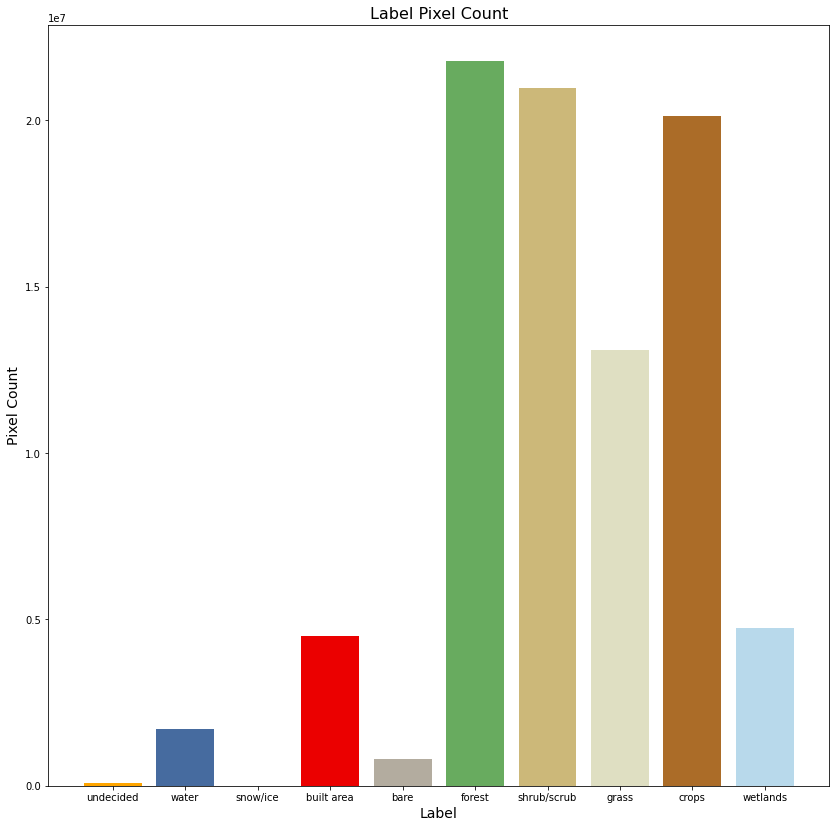

In [ ]:
# Plotting
plt.figure(figsize=(14,14))
# project_name_mapping is an ordered dict so the elements stay in the numerical 
# increasing order, which is why I can simply take the values
colors = [tuple(map(lambda x: x/255, color)) for color in  project_color_mapping.values()]
plt.bar(list(project_name_mapping.values()), hist_p, color=colors)
plt.ylabel('Pixel Count', fontsize=14)
plt.xlabel('Label', fontsize=14)
plt.title('Label Pixel Count', fontsize=16)
plt.show()

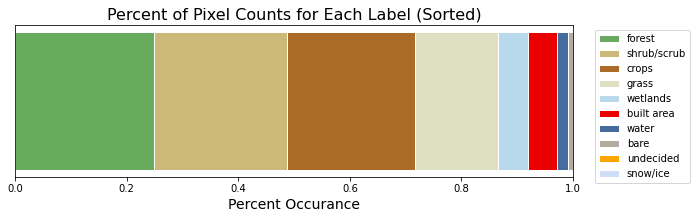

In [ ]:
# to probabilities
hist_per = hist_p/hist_p.sum()

# plot
plt.figure(figsize=(10,2.8))
left = 0
for i, (val, color, name) in enumerate(sorted(zip(hist_per, colors,project_name_mapping.values()), reverse=True)):
  plt.barh(0, val,
          color=color, edgecolor='white', label=name, left=left, height=0.1)
  left+= val
plt.ylabel('', fontsize=14)
plt.xlabel('Percent Occurance', fontsize=14)
plt.legend( bbox_to_anchor=(1.03, 1), loc='upper left')
plt.xlim(0, 1)
plt.yticks([])
plt.title('Percent of Pixel Counts for Each Label (Sorted)', fontsize=16)

plt.show()

#### Image-wise

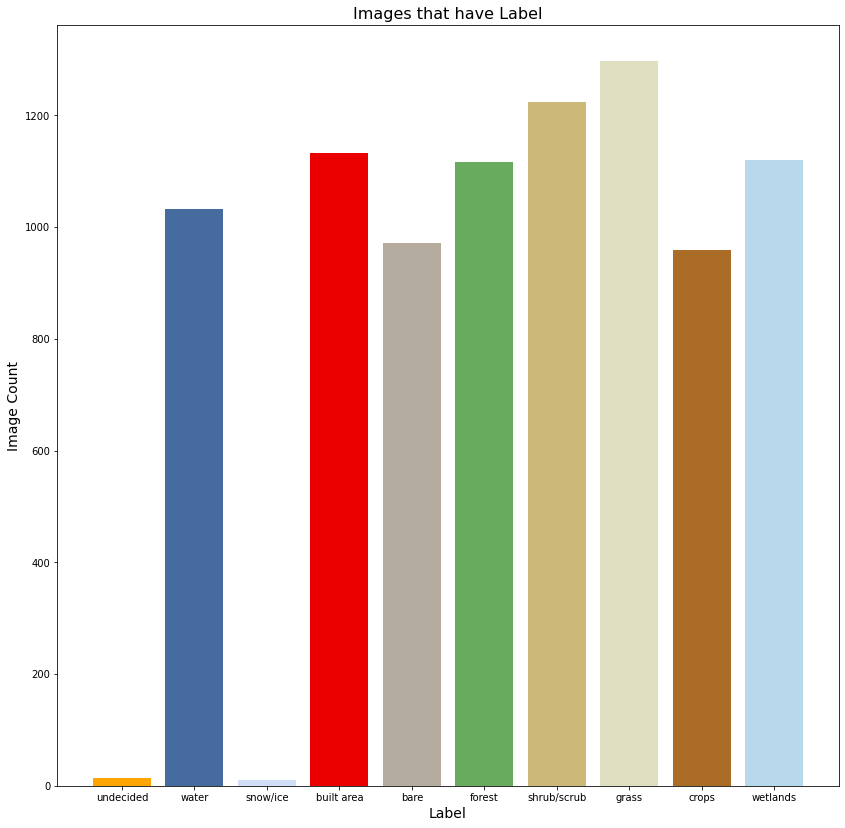

In [ ]:
# Plotting
plt.figure(figsize=(14,14))
# project_name_mapping is an ordered dict so the elements stay in the numerical 
# increasing order, which is why I can simply take the values
colors = [tuple(map(lambda x: x/255, color)) for color in  project_color_mapping.values()]
plt.bar(list(project_name_mapping.values()), hist_i, color=colors)
plt.ylabel('Image Count', fontsize=14)
plt.xlabel('Label', fontsize=14)
plt.title('Images that have Label', fontsize=16)
plt.show()

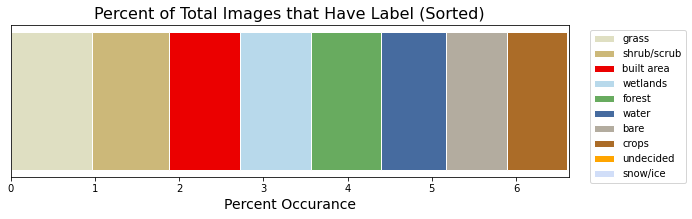

In [ ]:
# to probabilities
hist_per = hist_i/len(ds)

# plot
plt.figure(figsize=(10,2.8))
left = 0
for i, (val, color, name) in enumerate(sorted(zip(hist_per, colors, project_name_mapping.values()), reverse=True)):
  plt.barh(0, val,
          color=color, edgecolor='white', label=name, left=left, height=0.1)
  left+= val
plt.ylabel('', fontsize=14)
plt.xlabel('Percent Occurance', fontsize=14)
plt.legend( bbox_to_anchor=(1.03, 1), loc='upper left')
plt.xlim(0, hist_per.sum())
plt.yticks([])
plt.title('Percent of Total Images that Have Label (Sorted)', fontsize=16)

plt.show()

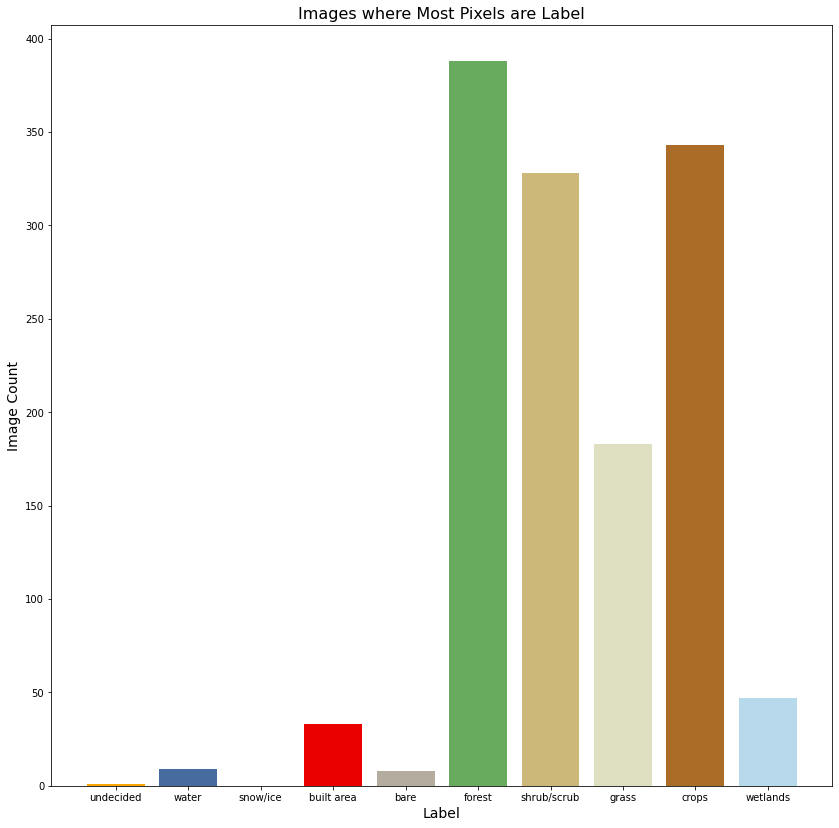

In [ ]:
# Plotting
plt.figure(figsize=(14,14))
# project_name_mapping is an ordered dict so the elements stay in the numerical 
# increasing order, which is why I can simply take the values
colors = [tuple(map(lambda x: x/255, color)) for color in  project_color_mapping.values()]
plt.bar(list(project_name_mapping.values()), hist_i_top, color=colors)
plt.ylabel('Image Count', fontsize=14)
plt.xlabel('Label', fontsize=14)
plt.title('Images where Most Pixels are Label', fontsize=16)
plt.show()

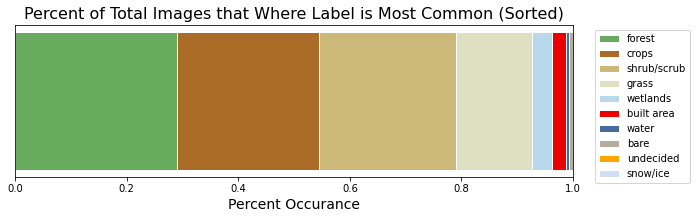

In [ ]:
# to probabilities
hist_per = hist_i_top/len(ds)

# plot
plt.figure(figsize=(10,2.8))
left = 0
for i, (val, color, name) in enumerate(sorted(zip(hist_per, colors, project_name_mapping.values()), reverse=True)):
  plt.barh(0, val,
          color=color, edgecolor='white', label=name, left=left, height=0.1)
  left+= val
plt.ylabel('', fontsize=14)
plt.xlabel('Percent Occurance', fontsize=14)
plt.legend( bbox_to_anchor=(1.03, 1), loc='upper left')
plt.xlim(0, hist_per.sum())
plt.yticks([])
plt.title('Percent of Total Images that Where Label is Most Common (Sorted)', fontsize=16)

plt.show()

#### Comments:
First we comment on the pixel analysis. This analysis is mostly in line with what the model will be trained on, as the model is supposed to predict pixel values. We see that our distribution of pixels into each of the classes is non-uniform, so we have a lot of forest, shrub, and crops pixels while we have fewer bare and ice pixels. This can become problematic during training, as we are inherently biasing the model toward the more common classes. This also tells us that we might want to be more careful when constructing the training and validation datasets. 

The next analysis was performed on images. We did two things for this: one aggregate a count of all the labels in each image (where we don't consider pixel count, but only if the label showed up in the image), and another is a count of the images where each label was the most common ome (so only store the label that has the highest pixel count per image). The prior one is meant to give a broader overview, what classes show up a lot and how many do we get per image. We see that all but the snow/ice label are common image labels and that we get a bit over 6 labels per image on average. For the latter analysis, it gives us a feel for the most prominent labels. We see that the label distribution is relatively close to the one we saw for pixels, except we get much less building and water. This tells us that buildings an water pixels are likely more spread out in the data (more images have them), but that they don't tend to be the major feature of the image. 


## Preprocessing

Copied task from above:

*Your second task is to train a landcover classification model. I have given you some tensorflow code to get started, which should give you a sense of how to build a data loader and input pipeline. When implemented properly, tensorflow will manage the "lazy-loading" of the dataset for you (e.g. only loading as much data as it needs to at once to keep the GPU fed).*

*A neural network architecture such as a UNet is a good choice, but you are free to use whatever model you choose. You are not required to use tensorflow (e.g. you can use Pytorch or just scikit-learn) but it may be the most straightforward choice given the code to get you started.*

*I expect you to think about ML concepts (and implement them if you decide they are applicable) such as:*

* *Train/val split*
* *Data normalization*
* *Data augmentation*
* *Regularization*

*Once your model is trained, I expect you to discuss the results (e.g. 
accuracy, validation loss) and show plots and analysis as appropriate.*

### Imports and parameters


In [ ]:
!pip install tensorflow_addons

     |████████████████████████████████| 706kB 6.0MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# some imports
from tensorflow.keras.models import Model
from tensorflow.keras.layers import (
        BatchNormalization,
        Conv2D,
        Conv2DTranspose,
        MaxPooling2D,
        Dropout,
        SpatialDropout2D,
        UpSampling2D,
        Input,
        concatenate,
        multiply,
        add,
        Activation,
    )             
import tensorflow_addons as tfa
from tensorflow_addons.layers import InstanceNormalization 
from keras.callbacks import LearningRateScheduler               # modify lr
from tensorflow.keras.layers.experimental import preprocessing  # augmentation
from sklearn.metrics import confusion_matrix                    # evaluation

In [ ]:
##################
### parameters  ##
##################

PERCENT_VALIDATION = 20
BUFFER = 64
BATCH=10

# Add data augmentation (might need more RAM so be careful)
augmenting=True

### Setting Up the Dataset

#### Making clouds undecided in the target 

I wouldn't expect the model to learn to predict what is under clouds accurately. By making all of the pixels that are labeled as clouds undecided we tell the model to not worry too much about trying to determine what is under the clouds and just label all clouds the same way, making the learning task easier. 

In [ ]:
def superimpose_cloud(input_image, input_mask):
  """
  set the pixels in the mask where the there are clouds to undecided - we don't
  want the clouds to affect our predictions 
  """
  # grab cloud mask
  cloud_mask = tf.expand_dims(input_image[:,:,8],-1)

  # tf.where forced me to cast the input mask back and forth to work
  input_mask = tf.where(cloud_mask==1, 0, tf.cast(input_mask, tf.int32))
  input_mask = tf.cast(input_mask, tf.uint8)
  return input_image, input_mask

In [ ]:
ds_p = ds.map(superimpose_cloud)

#### Adding Indices and Dropping Un-wanted Bands
I decided that I didn't want to feed all of the bands into the model ( alpha and cloudmask I didn't think would be much help) and wanted to add some indices to aid the model in its predictions. 

The indices I added were found online and in papers. I tried to add indices when I saw the model was not performing well in certain classes (so add indices for bare earth classification if I saw that the model was under-performing on its bare earth classification). 

I also note that some are not in use, but I left the code to produce these indices in the notebook in case I decide to add them back later. 




###### Index Functions - for the more complicated indices

In [ ]:
# normalized difference between 2 bands
def norm_diff(band1, band2):
  """
  Take the normalized difference between two bands
  """
  return tf.expand_dims((band1 - band2)/(band1+band2+tf.keras.backend.epsilon()), -1)


# normalized difference from a band stack by index
def norm_diff_from_bands(im, idx1, idx2):
  """ 
  Call the normalized difference function with a tensor and band indices
  """
  return norm_diff(im[:,:,idx1], im[:,:,idx2])

# BSI https://www.mdpi.com/2072-4292/9/12/1245/htm

def get_MBI(input_image):
  """
  Modified Bare Soil Index
  """
  swir2nir = input_image[:,:,6]+ input_image[:,:,4]
  swir1 = input_image[:,:,5]

  return norm_diff(swir1,swir2nir)

def get_BSI(input_image):
  """
  Bare Soil Index - for soil
  """
  swir2_red = input_image[:,:,3]+input_image[:,:,6]
  nir_blue = input_image[:,:,4]+input_image[:,:,1]

  return norm_diff(swir2_red,nir_blue)


def get_BSI1(input_image):
  """
  Bare Soil Index 1 - for soil
  """
  swir1_red = input_image[:,:,3]+input_image[:,:,5]
  nir_blue = input_image[:,:,4]+input_image[:,:,1]

  return norm_diff(swir1_red,nir_blue)

def get_SAVI(input_image):
  """
  SAVI index - for vegitation
  """
  nir= input_image[:,:,4]
  red = input_image[:,:,3]
  return tf.expand_dims((nir - red)*1.5/(nir+red+0.5), -1)

def get_EBBI(input_image):
  """
  Enhanced Built-Up and Bareness Index (EBBI) - built area
  """
  swir1=input_image[:,:,4]
  nir=input_image[:,:,5]
  return tf.expand_dims((swir1-nir)/10*tf.math.sqrt(swir1+nir), -1)


def get_TGDI(input_image):
  """
  Get TGDI index -  This one is supposed to be good for grass because it looks 
                    at edges and brightness together
  ** This index is expensive to compute 
  See: https://www.sciencedirect.com/science/article/pii/S1618866719305254?via%3Dihub
  """

  '''
  Originally this index is -log_{10}(canny)*brightness, but since canny is 
    somewhat expensive to calculate and isn't well interfaced with TensorFlow
    Sobel edge detection which are available in TensorFlow to get a different,
    roughter, reading of edges. 
  '''
  # get bands (Original paper used blue, green, red, & near-infrared)
  bands = input_image[:,:,1:5]  # [256,256, num_bands = 4]

  # brightness metric - since we have 4 bands I opted for mean rather than 
  # RGB greyscale 
  brightness = tf.expand_dims(tf.reduce_mean(bands, axis=-1),-1) #now [256,256, 1]

  # sobel edges ~ like the canny that they used but less expensive
  # tf.image.sobel_edges needs [batch, image_dim, image_dim, bands]
  resized_brightness = tf.expand_dims(brightness,0)   #[1, 256, 256, 1] 
  dxdy = tf.image.sobel_edges(resized_brightness)     #[1, 256, 256, 1, 2]
  
  # Here we do: M=|dx|+|dy| which is another type of edge detection like Canny
  edges = tf.squeeze(tf.reduce_sum(tf.abs(dxdy), axis=-1), 0)   #[256, 256, 1]

  # supposed to be log_{10} but we are using log_{e}  -> difference is a scaling
  # factor and since we normalize after it shouldn't be significant
  TGDI = -tf.math.log(edges+tf.keras.backend.epsilon())*brightness
  return TGDI

def get_GCC(input_image):
  """
  Greenness Chromatic Coordinate (GCC) - Useful for green pixels (vegitation)  
  """
  bands = []
  for band in [1,2,3]:
    bands.append(tf.slice(input_image, [0, 0, band], [-1, -1, 1]))
  green = bands[1]
  bands = tf.concat(bands, axis=2)
  sum = tf.expand_dims(tf.reduce_sum(bands, -1), -1)
  GCC = green/(sum+tf.keras.backend.epsilon())
  return GCC


def get_BI(input_image):
  """
  Bare Soil Index (BI) - Enhances the identification of bare soil areas and 
                          fallow lands
  See: https://medium.com/regen-network/remote-sensing-indices-389153e3d947
  """
  B3=input_image[:,:,2]
  B2B4 = input_image[:,:,1]+input_image[:,:,3]

  BI = (B2B4-B3)/(B2B4+B3+tf.keras.backend.epsilon())
  return tf.expand_dims(BI, -1)

def get_DBI(input_image):
  """
  Dry built index - buildings
  """
  return norm_diff_from_bands(input_image, 1, 7) - norm_diff_from_bands(input_image,4,3)

###### Forming the input 
Actually taking all of the functions before, and a few normalized difference indices and joining them with the dataset object. 

```
band_names_ordered = ['coastal-aerosol', 'blue', 'green', 'red', 'nir', 'swir1',
              'swir2', 'tirs1', 'cloud-mask', 'alpha']
```

In [ ]:
### CHOICES ###

# normalized differences list by band index:
# (NIR & red), (nir, green), (Swir1 & NIR), (red, tir), (swir1,tir)
#n_diff = [(4,3), (4,2), (5,4), (5,7)]


# (NIR & red), (nir, green), (Swir1 & swir2), (green, swir1) (nir, swir1)
# NDVI, GNDVI, NDTI,
n_diff = [(4,3), (4,2)]

# Other indices
# Vegitation Indices
USE_TGDI=False
USE_GCC=False
USE_SAVI=True

# Bare Earth indices
USE_BI=False 
USE_BSI=True
USE_BSI1=True
USE_EBBI=False
USE_DBI=False  #false
USE_MBI=True


# Weights - Not inuse right now
DIR ='/content/drive/MyDrive/RemoteSensing/tmp/'
weight_names = 'desired_histogram.json'

dataset = {}

In [ ]:
def make_input_tensor(input_image,
                      input_mask,
                      n_diff_list= n_diff,
                      tgdi=USE_TGDI,
                      gcc=USE_GCC,
                      bi=USE_BI,
                      bsi=USE_BSI,
                      bsi1=USE_BSI1, 
                      savi=USE_SAVI, 
                      ebbi=USE_EBBI, 
                      dbi=USE_DBI, 
                      mbi=USE_MBI):
  """
  Drop unwanted bands (alpha) and add indices to make one big tensor
  """
  # Select the bands we want
  bands= []
  # first 8 bands 
  bands.append(input_image[:,:,0:8])

  # indices
  if tgdi: 
    bands.append(get_TGDI(input_image))
  if gcc:
    bands.append(get_GCC(input_image))
  if bi:
    bands.append(get_BI(input_image))
  if bsi:
    bands.append(get_BSI(input_image))
  if bsi1:
    bands.append(get_BSI1(input_image))
  if savi:
    bands.append(get_SAVI(input_image))
  if ebbi:
    bands.append(get_EBBI(input_image))
  if dbi:
    bands.append(get_DBI(input_image))
  if mbi:
    bands.append(get_MBI(input_image))

  # Normalized differences
  for idx1, idx2, in n_diff_list:
    bands.append(norm_diff_from_bands(input_image, idx1, idx2))

  # Combine everything
  output_image = tf.concat(bands, axis=2)

  return output_image, input_mask

In [ ]:
# final count of bands for the model
output_bands = 8+len(n_diff)+USE_TGDI+USE_GCC+USE_BI+USE_BSI+USE_BSI1+USE_SAVI+USE_EBBI+USE_DBI+USE_MBI

#### Data Normalization

Here I first clip the values to a set maximum and then normalize by band to get 0 mean and 1 standard of deviation. 

I also initially clipped the inputs to reduce the effects of outliers, but that didn't help the accuracy so I took that out. 

In [ ]:
def normalize_bandwise(input_image, input_mask):
  """
  Normalize the input tensor band-wise
  """
  # clip values to set max
  # input_image = tf.clip_by_value(input_image, clip_value_min=0, clip_value_max=clip)
  
  # normalize bands by band to 0 mean and 1 stdv
  mean = tf.reduce_mean(input_image, axis=[0,1])
  var = tf.math.reduce_variance(input_image, axis=[0,1])+tf.keras.backend.epsilon()

  output_image = (input_image - mean)/var
  return output_image, input_mask

In [ ]:
def preprocess(input_image, input_mask, mask=True):
  """
  Combine earlier funcctions together 
  """
  # normalize and fix the bands as described before
  if mask:
    input_image, input_mask = superimpose_cloud(input_image, input_mask)
  input_image, input_mask = make_input_tensor(input_image, input_mask)
  input_image, input_mask = normalize_bandwise(input_image, input_mask)
  return input_image, input_mask

In [ ]:
ds_p = ds.map(preprocess)

#### Weighing Samples by Content Errors
I decided to weigh each sample by the weighted count of each class in the sample (a sample has different pixel counts of each class). 

The first weighing scheme came from the confusion matrix diagonal column. Ideally, this column would be all 1's, but since it isn't we can use the inverse of the matrix element as the weighing scheme (this way we give more weight to classes we got wrong and this increases the more wrong we were). 

I manually modified some of the weights, namely the 'unknown' class weight and the 'snow' class weight, which were both inf. I made unknown have a 0 weight becuase the more unknown there is in the image the more likely some of the pixels are to be misclassified - so I want to de-value the image. The snow weight I made 1 because the number of snow pixels is extremely low, so low in fact, that I don't really expect my model to capture them. 


**Sadly,** this didn't work well, and pretty much destroyed my confusion matrix (everything predicted to be a forest, which is NOT something I was looking for)

The next thing I tried is to base the class weights by the inverse pixel count histogram, again zeroing out undecided and 1-ing the snow/ice classes for the reasons above. 

In [ ]:
# I got these from the confusion matrix- 1/correct prediction
weights = [0, 1.1110068011369696, 1, 3.191502249441953, 7.838174509447674, 
           1.2259671839066977, 1.2873147968558918, 1.440781780835953,
           1.1094049728132493, 5.255502553218316]

# I got these from the pixel distributions round(1/(pixel_count/max_pixel_count_for_any_class))
weights = [0.0, 13.0, 1.0, 10.0, 27.0, 1.0, 1.0, 2.0, 1.0, 5.0]

def weight_sample(input_image, input_target, weights=np.array(weights).astype('int32')):
  """
  Weigh a sample based on the pixel count of each class
  """
  # get the classes present and their pixel counts
  flat  = tf.reshape(input_target, [-1])
  classes, _ , counts = tf.unique_with_counts(flat)

  # for each of the weights, check if the class is in the image. 
  # If it is, mulitply the count of the class by the weight and add it to the 
  # sample weight. 
  sample_weight = 0
  for i, weight in enumerate(weights):
    sample_weight+=tf.reduce_sum(tf.where(classes==i, 0, counts))*weight
  
  # normalize the weight by the total pixel count
  return input_image, input_target, sample_weight/(256*256)


In [ ]:
ds_p = ds_p.map(weight_sample)

#### Splitting into training and validation datasets


In [ ]:
def train_val_split(ds, percent_val=PERCENT_VALIDATION, buffer=BUFFER, seed=SEED):
  """
  Takes an input dataset, percent validation, buffer size, and seed and returns
  training and a validation sets created from from the input dataset prepared 
  for training
  """
  N = len(ds)

  # shuffle once
  ds = ds.shuffle(BUFFER, seed=SEED, reshuffle_each_iteration=False)

  # calculate the number of elements in the validation set
  N_val = int(N*percent_val*0.01)

  # return split datasets
  return ds.take(N_val), ds.skip(N_val)

In [ ]:
# split into training and validation
dataset['validation'], dataset['training'] = train_val_split(ds_p)

#### Caching, Prefetching, and Batching

We definitely want to batch the data, so that the learning process is faster. I also saw that we can cache and prefetch the dataset, which will store data locally and gets data that we need before we use it, and added those to speed up training. 

In [ ]:
def ds_batching(ds, batch=BATCH, autotune = tf.data.AUTOTUNE):
  # set up caching, prefetching, and batching for the dataset
  ds = ds.cache().prefetch(buffer_size=autotune)
  return ds.batch(BATCH, drop_remainder=True)

In [ ]:
train_ds =  ds_batching(dataset['training'])
val_ds = ds_batching(dataset['validation'])

#### Data Augmentation

https://www.tensorflow.org/tutorials/images/segmentation


Selected Augmentations:
* Random flip horizontally and vertically
* Random zoom-in  (no longer in use)
* Random rotation by 90 degree intervals

In [ ]:
# Random rotation layer by 90 degree intervals
class Random90Rot(preprocessing.PreprocessingLayer):
  def __init__(self, seed=None):
    super(Random90Rot, self).__init__()
    np.random.seed(seed)

  def __call__(self, inputs):
    num_rotations = np.random.choice(4)
    # rotate by 90-degrees 0-3 times where the number is random
    return tf.image.rot90(inputs, k=num_rotations)

In [ ]:
# Initialize the data augmentation model
data_augmentation = tf.keras.Sequential([
  preprocessing.RandomFlip("horizontal_and_vertical"),
  # preprocessing.RandomZoom(height_factor=(-0.3, 0.0)),
  Random90Rot(),
])

In [ ]:
# augment training set only
if augmenting:
  train_ds = train_ds.map(lambda x, y, z: (data_augmentation(x, training=True), y, z))

## ML

### Model 
I opted to copy a pre-made impllementation of U-net which can be found [here](https://github.com/karolzak/keras-unet/) and modify it to my needs. 


##### Definitions

In [ ]:
def upsample_conv(filters, kernel_size, strides, padding):
    return Conv2DTranspose(filters, kernel_size, strides=strides, padding=padding)

In [ ]:
def conv2d_block(
    inputs,
    use_batch_norm=True,
    dropout=0.3,
    dropout_type="spatial",
    filters=16,
    kernel_size=(3, 3),
    activation='elu',
    kernel_initializer="he_normal",
    padding="same",
    num_conv_in_block=2,
):

    if dropout_type == "spatial":
        DO = SpatialDropout2D
    elif dropout_type == "standard":
        DO = Dropout
    else:
        raise ValueError(
            f"dropout_type must be one of ['spatial', 'standard'], got {dropout_type}"
        )
    c = inputs
    for i in range(num_conv_in_block):
      c = Conv2D(
          filters,
          kernel_size,
          kernel_initializer=kernel_initializer,
          padding=padding,
          use_bias=not use_batch_norm,
      )(c)
      if use_batch_norm:
        c = InstanceNormalization()(c)
      c = Activation(activation)(c)
      if (dropout > 0.0) and (i+1 != num_conv_in_block):
        c = DO(dropout)(c)
    return c

In [ ]:
def custom_unet(
    input_shape,
    num_classes=10,
    activation="relu",
    use_batch_norm=True,
    upsample_mode="deconv",  # 'deconv' or 'simple'
    dropout=0.3,
    dropout_change_per_layer=0.0,
    dropout_type="spatial",
    use_dropout_on_upsampling=False,
    filters=16,
    num_layers=4,
    output_activation="softmax", # 'sigmoid' or 'softmax'
    num_conv_in_block=2,
    switch_dropout_on_upsample=True,
    reduce_dropout_on_upsample=0.5
):  
    """
    Customisable UNet architecture (Ronneberger et al. 2015 [1]).
    Arguments:
    input_shape: 3D Tensor of shape (x, y, num_channels)
    num_classes (int): Unique classes in the output mask. Should be set to 1 for binary segmentation
    activation (str): A keras.activations.Activation to use. ReLu by default.
    use_batch_norm (bool): Whether to use Batch Normalisation across the channel axis between convolutional layers
    upsample_mode (one of "deconv" or "simple"): Whether to use transposed convolutions or simple upsampling in the decoder part
    dropout (float between 0. and 1.): Amount of dropout after the initial convolutional block. Set to 0. to turn Dropout off
    dropout_change_per_layer (float between 0. and 1.): Factor to add to the Dropout after each convolutional block
    dropout_type (one of "spatial" or "standard"): Type of Dropout to apply. Spatial is recommended for CNNs [2]
    use_dropout_on_upsampling (bool): Whether to use dropout in the decoder part of the network
    filters (int): Convolutional filters in the initial convolutional block. Will be doubled every block
    num_layers (int): Number of total layers in the encoder not including the bottleneck layer
    output_activation (str): A keras.activations.Activation to use. Sigmoid by default for binary segmentation
    num_conv_in_block (int): number of convolutional layers in a convolutional block
    reduce_dropout_on_upsample (float between 0 & 1) Factor to reduce from Dropout for each upsampling convolutional block
    Returns:
    model (keras.models.Model): The built U-Net
    Raises:
    ValueError: If dropout_type is not one of "spatial" or "standard"
    [1]: https://arxiv.org/abs/1505.04597
    [2]: https://arxiv.org/pdf/1411.4280.pdf
    [3]: https://arxiv.org/abs/1804.03999
    """

    if upsample_mode == "deconv":
        upsample = upsample_conv
    else:
        upsample = upsample_simple

    # Build U-Net model
    inputs = Input(input_shape)
    x = inputs

    down_layers = []
    for l in range(num_layers):
        x = conv2d_block(
            inputs=x,
            filters=filters,
            use_batch_norm=use_batch_norm,
            dropout=dropout,
            dropout_type=dropout_type,
            activation=activation,
            num_conv_in_block=num_conv_in_block,
        )
        down_layers.append(x)
        x = MaxPooling2D((2, 2))(x)
        dropout += dropout_change_per_layer
        filters = filters * 2  # double the number of filters with each layer

    x = conv2d_block(
        inputs=x,
        filters=filters,
        use_batch_norm=use_batch_norm,
        dropout=dropout,
        dropout_type=dropout_type,
        activation=activation,
        num_conv_in_block=num_conv_in_block,
    )
    if switch_dropout_on_upsample and (dropout_type=='spatial'):
      dropout_type='standard'
    elif not use_dropout_on_upsampling:
        dropout = 0.0
        dropout_change_per_layer = 0.0

    for conv in reversed(down_layers):
        filters //= 2  # decreasing number of filters with each layer
        dropout -= dropout_change_per_layer
        if reduce_dropout_on_upsample !=0.0:
          dropout -= reduce_dropout_on_upsample
        x = upsample(filters, (2, 2), strides=(2, 2), padding="same")(x)

        x = concatenate([x, conv])
        x = conv2d_block(
            inputs=x,
            filters=filters,
            use_batch_norm=use_batch_norm,
            dropout=dropout,
            dropout_type=dropout_type,
            activation=activation,
            num_conv_in_block=num_conv_in_block,
        )

    outputs = Conv2D(num_classes, (1, 1), activation=output_activation)(x)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model

In [ ]:
""" Best Model So Far 61% but overfitting
model = custom_unet(
    input_shape=(256, 256, output_bands),
    use_batch_norm=True,
    num_classes=NUM_CLASSES,
    filters=64,
    num_layers=5,
    dropout=0.1,
    num_conv_in_block=2,
    output_activation='softmax')
"""

" Best Model So Far 61% but overfitting\nmodel = custom_unet(\n    input_shape=(256, 256, output_bands),\n    use_batch_norm=True,\n    num_classes=NUM_CLASSES,\n    filters=64,\n    num_layers=5,\n    dropout=0.1,\n    num_conv_in_block=2,\n    output_activation='softmax')\n"

##### Initializing model

In [ ]:
# create model
model = custom_unet(
    input_shape=(256, 256, output_bands),
    use_batch_norm=True,
    num_classes=NUM_CLASSES,
    dropout_type='standard',
    use_dropout_on_upsampling=True,
    filters=64,
    num_layers=4,
    dropout=0.5,
    reduce_dropout_on_upsample=0.1,
    num_conv_in_block=2,
    output_activation='softmax'
    )

model = custom_unet(
    input_shape=(256, 256, output_bands),
    use_batch_norm=True,
    num_classes=NUM_CLASSES,
    dropout_type='standard',
    use_dropout_on_upsampling=True,
    filters=64,
    num_layers=4,
    dropout=0.5,
    num_conv_in_block=2,
    output_activation='softmax')

model.compile(loss = tf.keras.losses.SparseCategoricalCrossentropy(),
              optimizer = 'adam', 
              metrics = ['acc'])

model.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 256, 256, 14 0                                            
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 256, 256, 64) 8064        input_6[0][0]                    
__________________________________________________________________________________________________
instance_normalization_90 (Inst (None, 256, 256, 64) 128         conv2d_95[0][0]                  
__________________________________________________________________________________________________
activation_90 (Activation)      (None, 256, 256, 64) 0           instance_normalization_90[0][0]  
____________________________________________________________________________________________

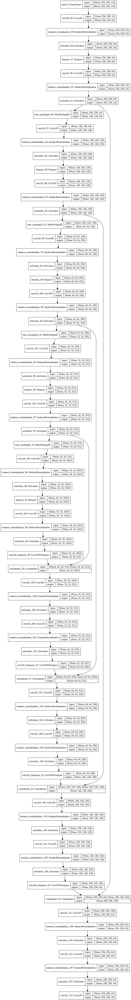

In [ ]:
# visualize the model created
tf.keras.utils.plot_model(model, show_shapes=True)

#### Callbacks
* Learning Rate Scheduler - Change the learning rate based on epoch
* Checkpoints - save the 'best' model so far (based on val loss) so we can use it later
* nanLoss - stop training if loss is nan

In [ ]:
#Callbacks
def lr_schedule(epoch): 
	lr = 1e-3
	if epoch >= 110:
		lr *= 5e-2
	elif epoch >= 90:
		lr *= 1e-1
	elif epoch >= 45:
		lr *= 2e-1
	elif epoch >= 20:
		lr *= 5e-1
	print('Learning rate: ', lr)
	return lr

#Callbacks
initial_learning_rate = 0.002

lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate,
    decay_steps=2,
    decay_rate=0.96,
    staircase=True)

lr_scheduler = LearningRateScheduler(lr_schedule, verbose=1)


# save model checkpoint
checkpoint_path = '/content/drive/MyDrive/RemoteSensing/tmp/checkpoint'
checkpoint_dir = os.path.dirname(checkpoint_path)
#os.mkdir(checkpoint_dir)

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1, 
                                                 save_best_only=True)

# stop on nan loss
class nanLoss(tf.keras.callbacks.Callback):
  def on_train_epoch_end(self, batch, logs=None):
      if (tf.math.is_nan(logs["loss"])):
        print('')
        print('Oh No! Your loss is NAN!')
        self.model.stop_training = True


callbacks = [cp_callback, lr_scheduler, nanLoss()]

#### Training

In [ ]:
# load weights
# model.load_weights(checkpoint_path)

# Train the Model
history = model.fit(
    train_ds,
    epochs = 80,
    validation_data = val_ds, 
    verbose = 1,
    callbacks=callbacks,
)

Epoch 1/80

Epoch 00001: LearningRateScheduler reducing learning rate to tf.Tensor(0.002, shape=(), dtype=float32).
107/107 [==============================] - 369s 3s/step - loss: 115.8952 - acc: 0.2452 - val_loss: 97.5546 - val_acc: 0.4062

Epoch 00001: val_loss improved from inf to 97.55464, saving model to /content/drive/MyDrive/RemoteSensing/tmp/checkpoint
Epoch 2/80

Epoch 00002: LearningRateScheduler reducing learning rate to tf.Tensor(0.002, shape=(), dtype=float32).
107/107 [==============================] - 95s 890ms/step - loss: 97.2642 - acc: 0.3991 - val_loss: 92.5955 - val_acc: 0.4317

Epoch 00002: val_loss improved from 97.55464 to 92.59551, saving model to /content/drive/MyDrive/RemoteSensing/tmp/checkpoint
Epoch 3/80

Epoch 00003: LearningRateScheduler reducing learning rate to tf.Tensor(0.0019200001, shape=(), dtype=float32).
107/107 [==============================] - 94s 884ms/step - loss: 92.2980 - acc: 0.4269 - val_loss: 90.9973 - val_acc: 0.4351

Epoch 00003: val_l

In [ ]:
# save model
save_path ='/content/drive/MyDrive/RemoteSensing/tmp/my_model2.h5' 
model.save(save_path)

In [ ]:
# for longer training
history = model.fit( 
    train_ds,
    initial_epoch=80,
    epochs = 150,
    validation_data = val_ds, 
    verbose = 1,
    callbacks=callbacks,
)

### Evaluating the trained model

#### Learning Curve

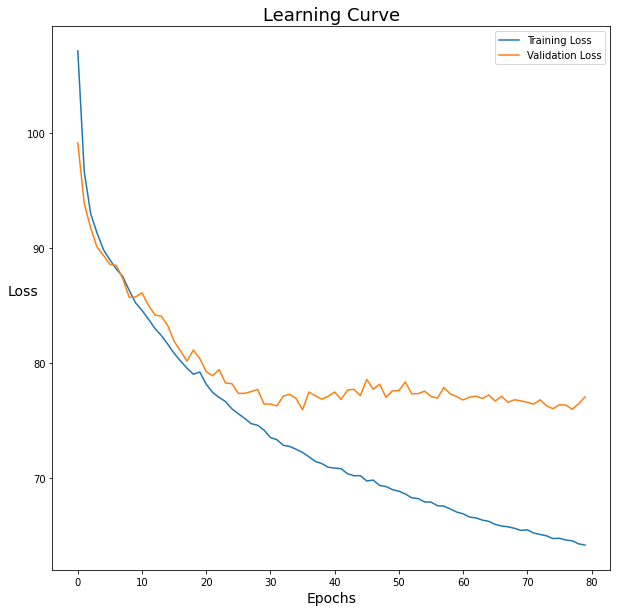

In [ ]:
# Learning Curve
plt.figure(figsize = (10,10))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.xlabel('Epochs', fontsize = 14)
h = plt.ylabel('Loss',fontsize = 14)
h.set_rotation(0)
plt.title('Learning Curve', fontsize = 18)
plt.legend(['Training Loss', 'Validation Loss'])
plt.show()

#### Confusion Matrix

In [ ]:
model = tf.keras.models.load_model(save_path)

In [ ]:
# read in predictions and true targets
y_pred = []
y_true = []
for image, target, _ in val_ds:
  y_pred.append(np.argmax(model.predict(image), axis=-1))
  y_true.append(target.numpy())
y_pred = np.stack(y_pred).flatten()
y_true = np.stack(y_true).flatten()


In [ ]:
# Generate the confusion matrix
conf = confusion_matrix(y_true,
                        y_pred, 
                        labels = np.arange(0,NUM_CLASSES,1),
                        normalize='true')

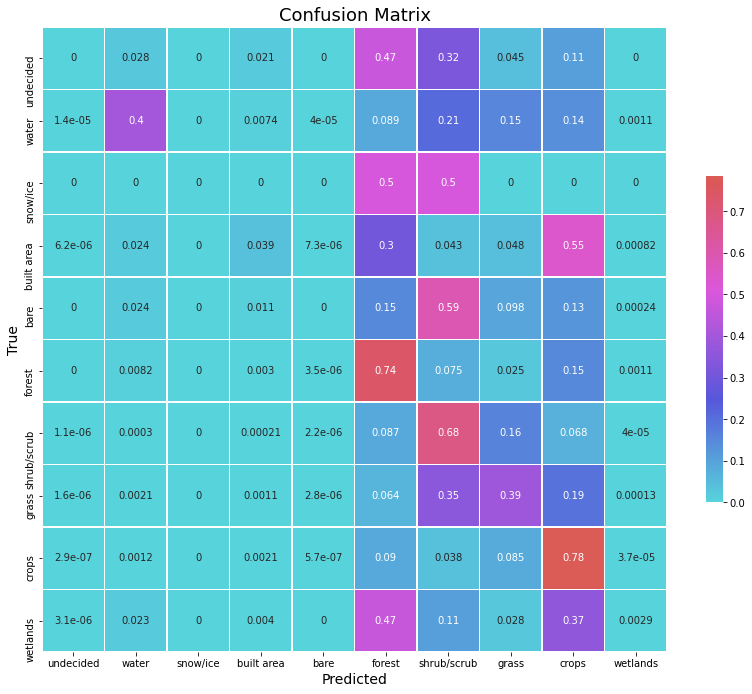

In [ ]:
# make into df because sklearn reads it better
names = list(project_name_mapping.values())
cond_df = pd.DataFrame(conf, index = names,
                       columns = names)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(14, 12))
ax.set_title('Confusion Matrix', fontsize = 18)

# Color Map
cmap1 = sns.color_palette("hls", 8, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(cond_df, cmap=cmap1, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
ax.set_xlabel('Predicted', fontsize=14)
ax.set_ylabel('True', fontsize=14)
plt.show()

## Comments
Things I tried:
* More/less concolutions in each block
* Smaller/bigger batch size
* More/less layers in U-net
* different kernel regularization (l1, l2, none)
* different order of layers in conv_block (drop-out & batch-norm)
* different amounts of dropout (from 0.01 to 0.5)
* different types of dropout (spatial vs normal)
* with/witout batch-norm
* instance norm
* different data augmentation (rotations, zooms, flips)
* different bands as inputs (a lot of permutations of the given bands)
* different normaized differences (NDVI, NDWI, NDBI, NDSI, ...)
* different indices (TGDI, GCC, ...)
* sample weights (with different weighing schemes as well)
* Setting clouds to unknown in the targets 
* diiferent unet types (Unet++ specifically)

I also decided that the undecided pixels should be counted as 'I don't care' because they are not actually labeled (so we don't know which of the classes they are). 

I found optimizing the model to be really difficult. For one, there were so many different options for ways to do that that I was a bit overwhelmed. I could change the model, the inputs, how I weigh samples, how I preprocess the data, and the list just keeps on going. I tried a lot of different ways to impove my accuracy, which I listed above, but I didn't find them to be too helpful in improving accuracy (which we also said may not be the best metric to even evaluate this problem). I ran into a lot of problems with creating the dataset, training properly, and pretty much every step in the process, but I found it really rewarding to be able to solve my problems through reading documentation and talking with some of my peers. 

At some point in the project, I decided that overall accuracy wasn't my main focus, and wanted to make the confusion matrix true positives more spread out over the classes (by this I mean that I didn't like getting a 1 for forests but a 0 for my bare class and would have been much happier with a .7 in both). This started me thinking about the problem iteslf and whether or not I should be following this new way of evaluation, which made me realize how little I know about properly evaluating my models. 

I also wanted to comment on my performance. Looking back, I could have been smarter about my testing procedure, especially by keeping a more careful track of the performed experiments which would have allowed me to make more meaningful future tests. I kept going back and forth with what I tested and that essentially wasted some of my training time. I also attempted to change multiple parameters at once, and ended up not realizing what was causing my accuracy changes.  I had runs where I stopped training midway or timed-out on collab, so I didn't standardize the way I evaluated models in a good way (comparing a model with 30 epochs of training to one with 80 doesn't seem like a great choice). I found it really hard to have to wait for hours to see the accuracy of my model, as it was somthing I wasn't really used to.

I am not too happy with the final validation accuracy I got in this project, which didn't exceed 60% after so many tests, but I couldn't figure out what kept this accuracy so low. 

Throughout the process I noticed the need for regularization, as my validation and training set accuracy started to diverge. This was really interesting to see because of how significant the differences became. 

I also wanted to say that I found it really interesting to see the speed my code runs at different times of day (likely due to me only using the cloud stored data). I was wondering if that becomes a challenge when training bigger models as well. 




## Output Function
*Every model will be scored against a test set that I have that you do not have access to. In order to facilitate evaluation, you will be expected to provide a function that reads in your model, accepts takes an input file (in the same format as every training image) and outputs a single band classification raster that follows the classification scheme above.*

### Directions for use:
As I wrote above, to run the predict function please load the dataset through the code in 'Code examples to get you started' as well as run the preprocessing cells to load functions and replicate the paramaters I used in training the model. 

Saved model link: 
https://drive.google.com/file/d/1dd2bVXThv-Irip2BAfdEe102eoBYQpgM/view?usp=sharing


### Testing function

In [ ]:
def predict(ds_input, model_path):  
  """
  Takes a dataset and a path to a saved model. Proceeds to run the preprocessing 
  script on the dataset and predict outputs based on on the saved model. 
  
  params:
  ds_input (tf.dataset): an unprocessed dataset with targets remapped to the project output classes
  model_path (file_path): path to saved tf model
  
  return:
  y_pred: np.array of predicted images from the
  y_true: np.array of true target values. 
  """

  # dataset preprocessing
  ds = ds_input.map(preprocess)

  # remap dataset and add dim to images 'for batching'
  # load model
  model = tf.keras.models.load_model(model_path)

  # predict
  y_pred =  []
  y_true = []
  for image, target in ds:
    prediction = model.predict(tf.expand_dims(image, 0))
    y_pred.append(prediction)
    y_true.append(target)

  # stack into numpy arrays
  y_pred = np.stack(y_pred)
  y_true = np.stack(y_true)

  return y_pred, y_true


In [ ]:
# taking 30 samples as a test set (not really a test set but just to show the 
# viz and functions are working)
ds_test = ds.take(30)
model_path = '/content/drive/MyDrive/RemoteSensing/LandCover/my_model2.h5'
# Example call:
pred, true = predict(ds_test, model_path)

## Visualizations

In [ ]:
# Project color scheme
project_color_mapping = OrderedDict({
    0: (255,165,0),
    1: (70, 107, 159),
    2: (209, 222, 248),
    3: (235, 0, 0),
    4: (179, 172, 159),
    5: (104, 171, 95),
    6: (204, 184, 121),
    7: (223, 223, 194),
    8: (171, 108, 40),
    9: (184, 217, 235),
})


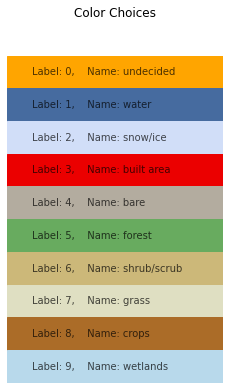

In [ ]:
# Printing the color choices
color_choices = project_color_mapping.items()

fig = plt.figure(figsize=[3, 5])
ax = fig.add_axes([0, 0, 1, 1])

n_rows = len(color_choices) 
text_args = dict(va='center', fontsize=10 )
for j, color_choice in enumerate(color_choices):
    color = tuple(map(lambda x: x/255, color_choice[1]))
    class_number = color_choice[0]
    name = project_name_mapping[color_choice[0]]
    
    y_pos = j % n_rows
    ax.add_patch(mpatch.Rectangle(( 0, y_pos), 5, 1, color=color))
    ax.text(0, y_pos + .5, '        Label: ' + str(class_number) + 
            ',    Name: '+name, alpha=0.7, **text_args)


ax.set_xlim(0, 1)
ax.set_ylim(n_rows, -1)
ax.set_title('Color Choices')
ax.axis('off')

plt.show()

In [ ]:
# build a matplotlib colormap so we can visualize this data
colors = list()
for idx, class_val in enumerate(project_color_mapping.keys()):
  red, green, blue = project_color_mapping[class_val]

  color_vec = np.array([red/255, green/255, blue/255])
  colors.append(color_vec)

colors = np.stack(colors)
cmap = matplotlib.colors.ListedColormap(colors=colors, N=len(colors))

bounds = list(range(len(colors)))
norm = matplotlib.colors.BoundaryNorm(bounds, len(colors))

In [ ]:
# write a function so that we can display image/target/predictions
def display_image_target(display_list):
  plt.figure(dpi=200)
  title = ['Image', 'Target', 'Prediction']

  for idx, disp in enumerate(display_list):
    plt.subplot(1, len(display_list), idx+1)
    plt.title(title[idx], fontsize=6)
    plt.axis('off')

    if title[idx] == 'Image':
      arr = disp.numpy()
      rgb = np.stack([arr[:, :, 3], arr[:, :, 2], arr[:, :, 1]], axis=-1) / 3000.0
      plt.imshow(rgb)

    elif title[idx] == 'Target':
      tgt = disp.numpy().squeeze()
      plt.imshow(tgt, interpolation='none', norm=norm, cmap=cmap)

    elif title[idx] == 'Prediction':
      pred = np.argmax(disp, axis=-1) # argmax across probabilities to get class outputs
      plt.imshow(pred, interpolation='none', norm=norm, cmap=cmap)

  plt.show()
  plt.close()

In [ ]:
def display_target(display_list):
  """
  Displays the target image with classes as we 
  """
  plt.figure(dpi=200)

  for idx, disp in enumerate(display_list):
    plt.subplot(1, len(display_list), idx+1)
    plt.title('Target', fontsize=6)
    plt.axis('off')

    tgt = disp.numpy().squeeze()
    plt.imshow(tgt, interpolation='none', norm=norm, cmap=cmap)

  plt.show()
  plt.close()

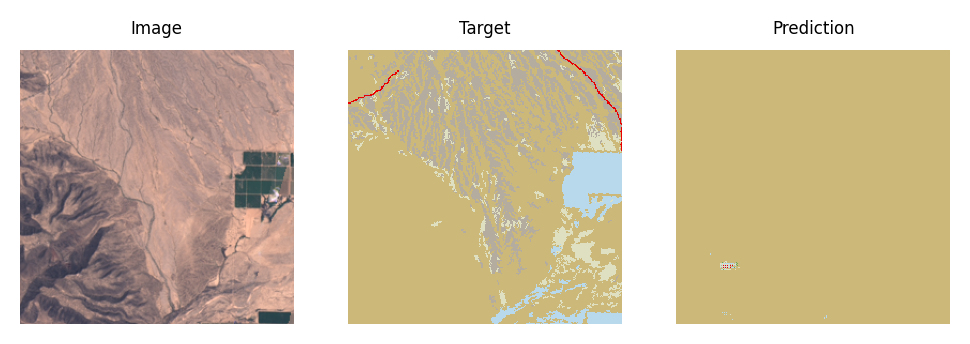

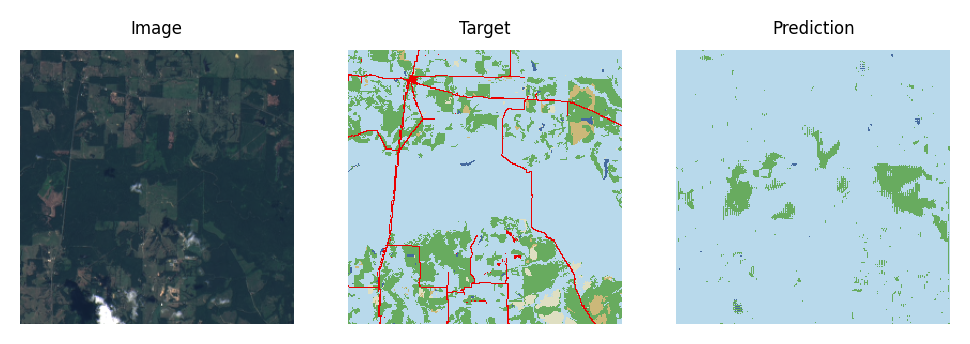

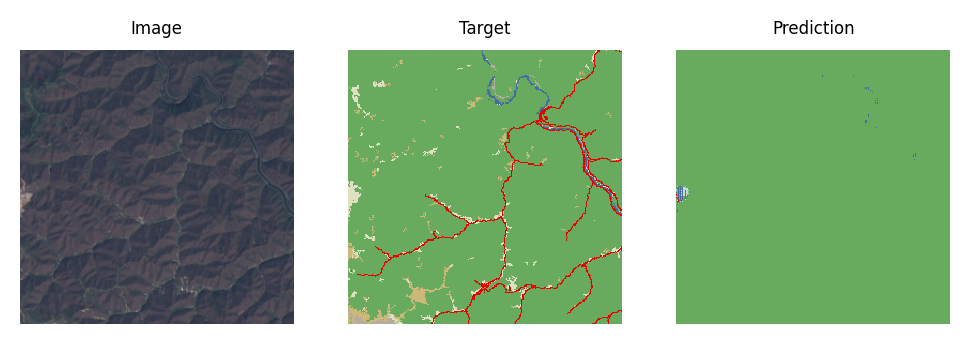

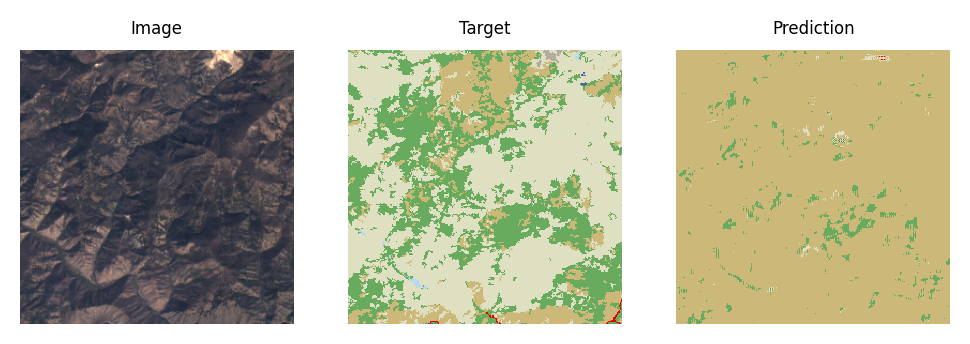

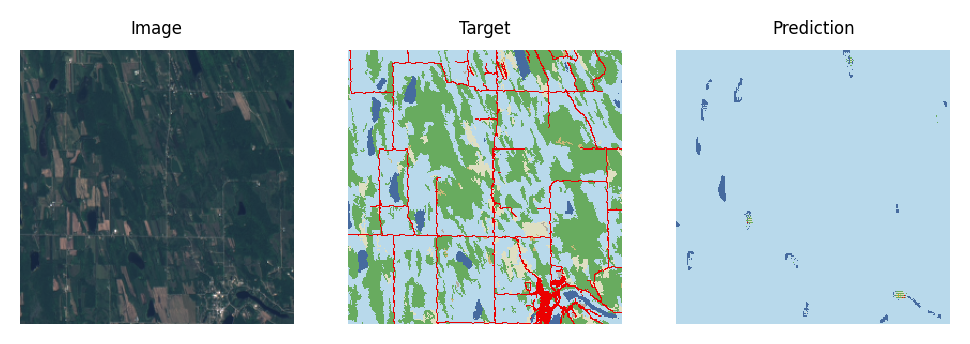

...

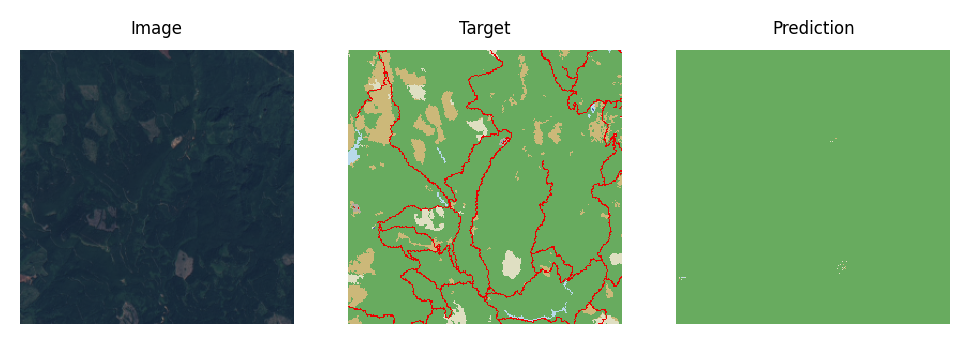

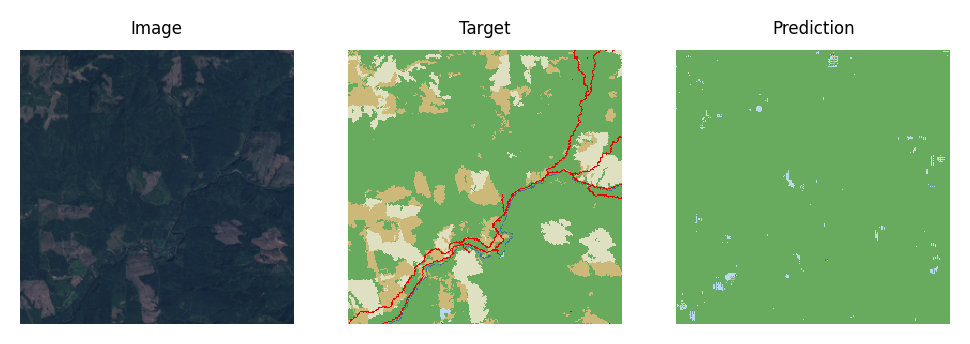

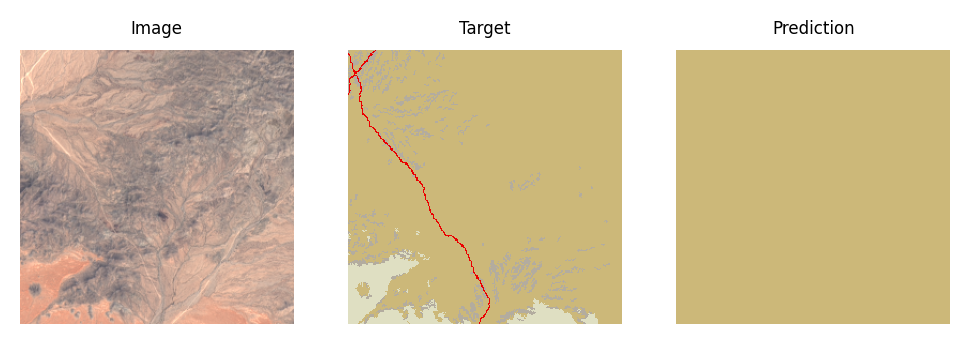

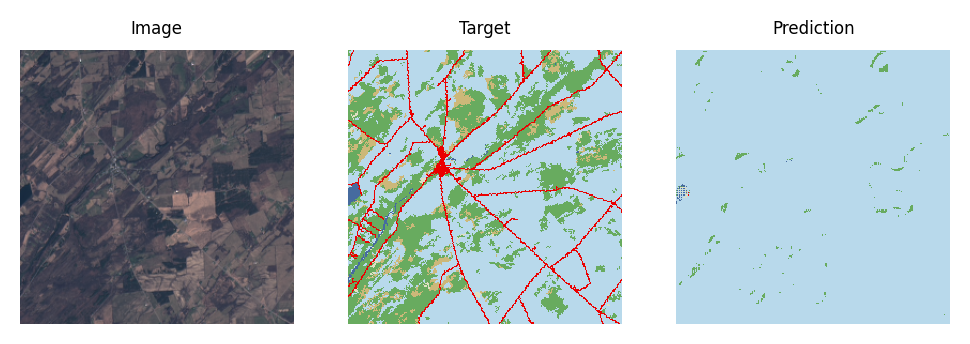

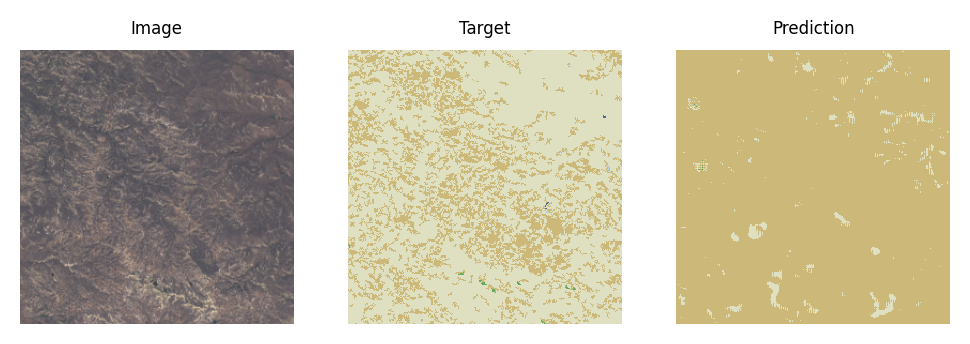

In [ ]:
# displaying the output predictions and saving the tarrgets
y_true = []
for i, (img, tgt) in enumerate(ds_test):
  display_image_target([img, tgt, pred[i].reshape(256,256,-1)])
  y_true.append(tgt)
y_true=np.stack(y_true)

In [ ]:
conf = confusion_matrix(true.flatten(),
                        np.argmax(pred,-1).flatten(), 
                        labels = np.arange(0,NUM_CLASSES,1),
                        normalize='true')

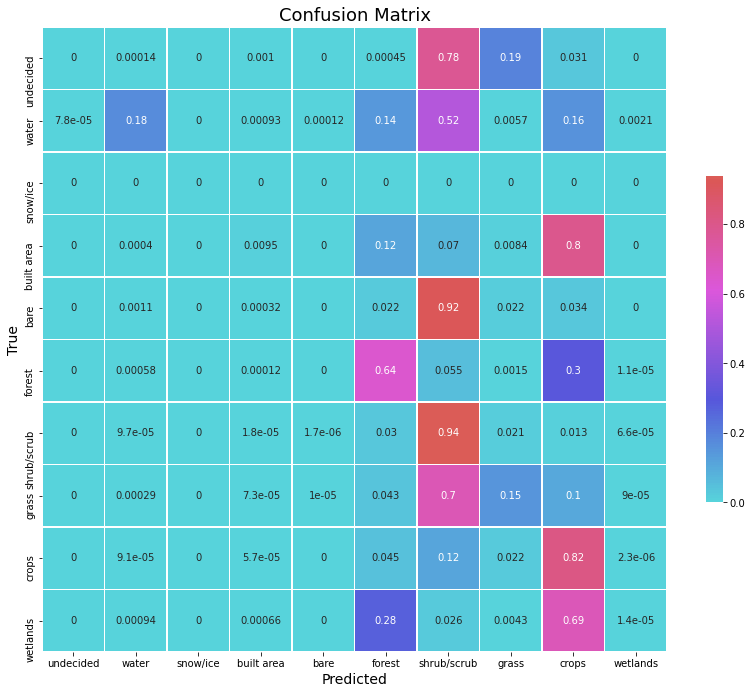

In [ ]:
# make into df because sklearn reads it better
names = list(project_name_mapping.values())
cond_df = pd.DataFrame(conf, index = names,
                       columns = names)

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(14, 12))
ax.set_title('Confusion Matrix', fontsize = 18)

# Color Map
cmap1 = sns.color_palette("hls", 8, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(cond_df, cmap=cmap1, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})
ax.set_xlabel('Predicted', fontsize=14)
ax.set_ylabel('True', fontsize=14)
plt.show()